In [1]:
from matplotlib import pyplot as plt
import os
import numpy as np
from simulation_similarity_analysis.dataset_processing import IMG_TYPES, TIMESTEPS, DatasetProcessing, SimilarityMetric
import glob
import pandas as pd
import re
plt.rcParams['text.usetex'] = True

In [5]:
dataset_name = "no_dose_analysis"
# dataset_name= "baseline_dose_analysis"
# dataset_name = "best_dose_analysis"

dataset = DatasetProcessing("no_dose_dataset_start=350_interval=100_ndraw=8_size=(64,64)", dataset_name, jupyter=True)
parameters = {
    "cell_cycle":"Duration of the cell cycle $t_{total}$",
    "average_healthy_glucose_absorption":"Average healthy glucose absorption $\mu_{g,healthy}$",
    "average_cancer_glucose_absorption":"Average cancer glucose absorption $\mu_{g,cancer}$",
    "average_healthy_oxygen_consumption":"Average healthy oxygen consumption $\mu_{o,healthy}$",
    "average_cancer_oxygen_consumption":"Average cancer oxygen consumption $\mu_{o,cancer}$"
             }

# Principal Component Analysis (PCA)
## All variation

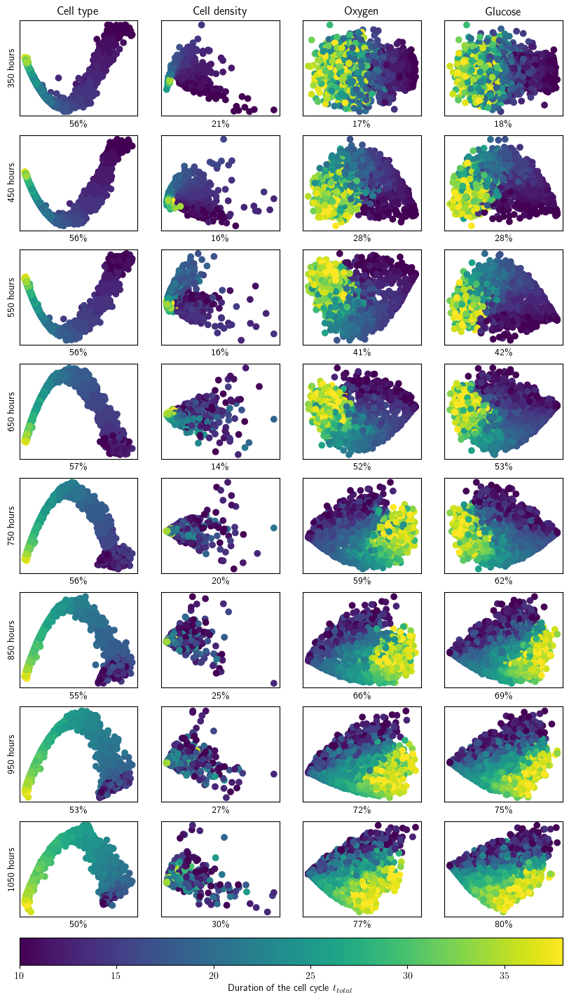

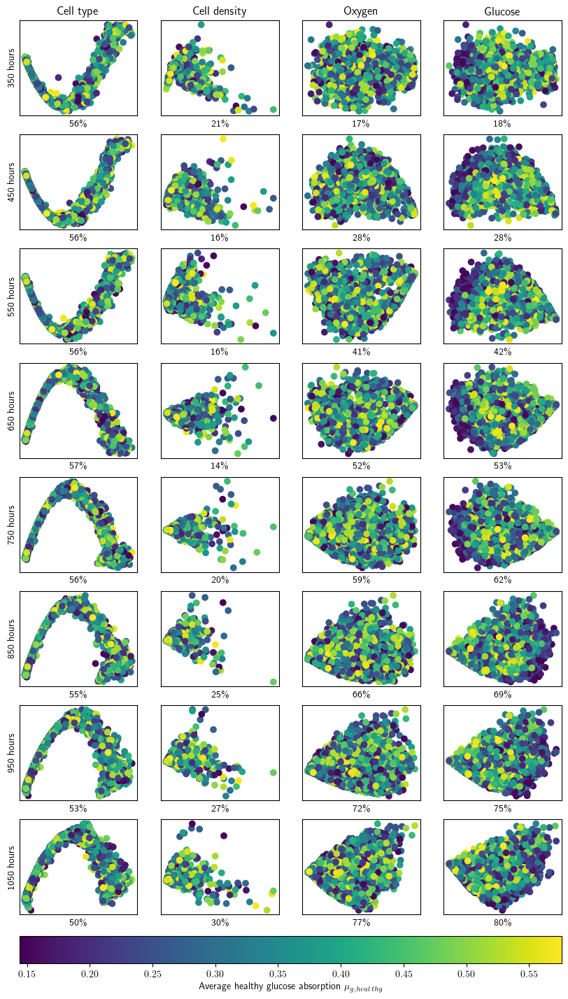

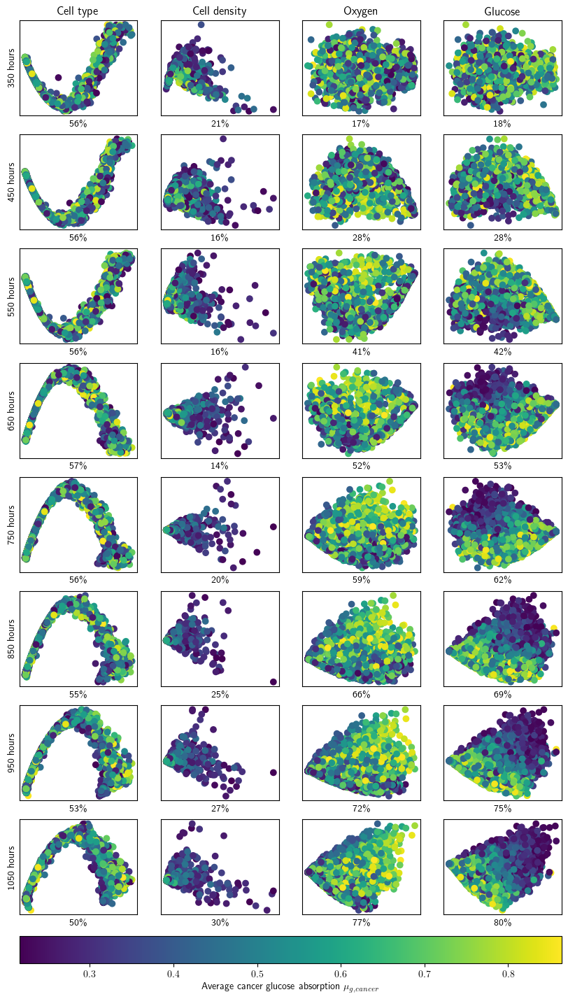

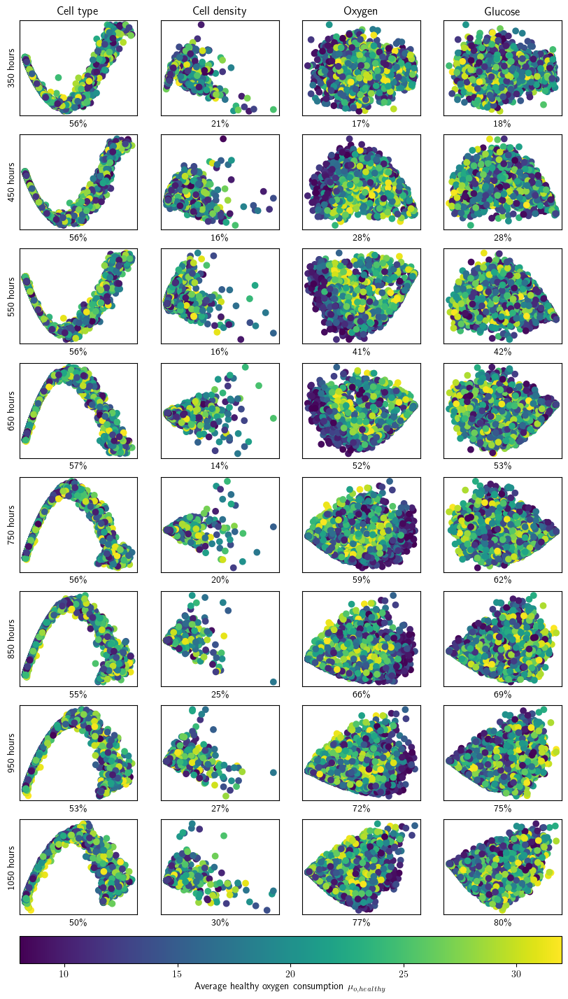

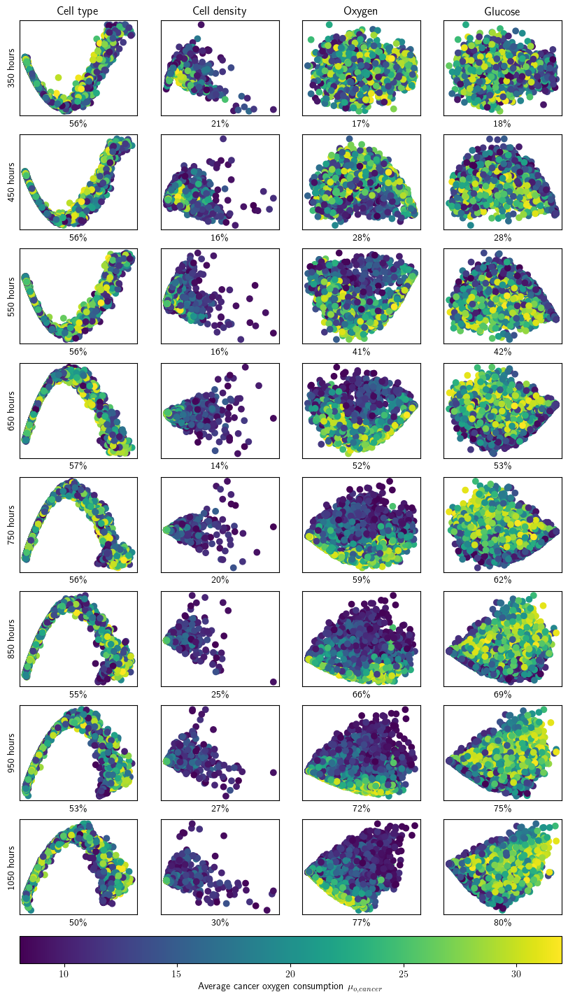

In [14]:
im=None
for param in parameters.keys():
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    for i, draw in enumerate(TIMESTEPS):
        for j, image_type in enumerate(IMG_TYPES):
            file_start = os.path.join(dataset_name,"pca",f'pca_{image_type}_{draw}_vr*')
            matching_files = glob.glob(file_start)[0]
            explained_variance = float(matching_files.split('=')[1][:-4])
            pca_data = np.load(matching_files)
            im = ax[i,j].scatter(pca_data[:,0],pca_data[:,1], c=target, rasterized = True)
            
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            
            ax[i,j].set_xlabel(f"{int(explained_variance*100)}\%")
            
            
                
    for axes, col in zip(ax[0], ["Cell type","Cell density","Oxygen","Glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], range(350,1150,100)):
        axes.set_ylabel(f"{row} hours")
        
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.02, label=f"{parameters[param]}")
    plt.savefig(os.path.join(dataset_name,"pca", f'all_pca_{param}.pdf'),bbox_inches='tight', format='pdf', dpi=100) 


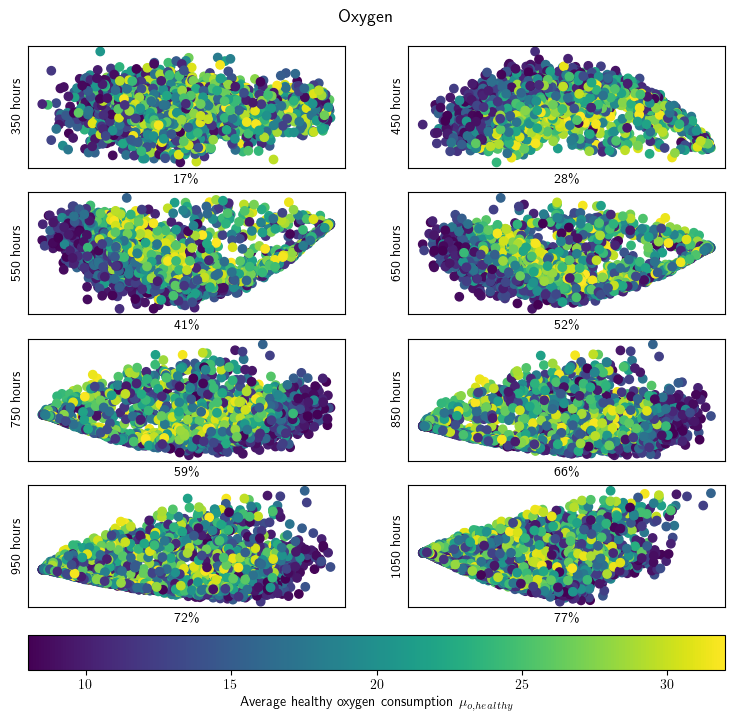

In [42]:
# Cropped version
param ="average_healthy_oxygen_consumption"
img_types = [IMG_TYPES[2]]
im=None
fig, ax = plt.subplots(4,2, figsize = (9,9))
target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
for i, draw in enumerate(TIMESTEPS):
    for j, image_type in enumerate(img_types):
        file_start = os.path.join(dataset_name,"pca",f'pca_{image_type}_{draw}_vr*')
        matching_files = glob.glob(file_start)[0]
        explained_variance = float(matching_files.split('=')[1][:-4])
        pca_data = np.load(matching_files)
        
        row = i%2
        column = i//2
        im = ax[column, row].scatter(pca_data[:,0],pca_data[:,1], c=target, rasterized = True)
        
        ax[column, row].xaxis.set_tick_params(labelbottom=False)
        ax[column, row].yaxis.set_tick_params(labelleft=False)
        ax[column, row].set_xticks([])
        ax[column, row].set_yticks([])
        
        ax[column, row].set_xlabel(f"{int(explained_variance*100)}\%")
        
        ax[column, row].set_ylabel(f"{draw} hours")
        
        
            
fig.suptitle("Oxygen", y = 0.92, fontsize = 13)


    

cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.04, label=f"{parameters[param]}")
plt.savefig(os.path.join(dataset_name,"pca", f'all_pca_{param}_cropped.pdf'),bbox_inches='tight', format='pdf', dpi=100) 

## Combined PCA

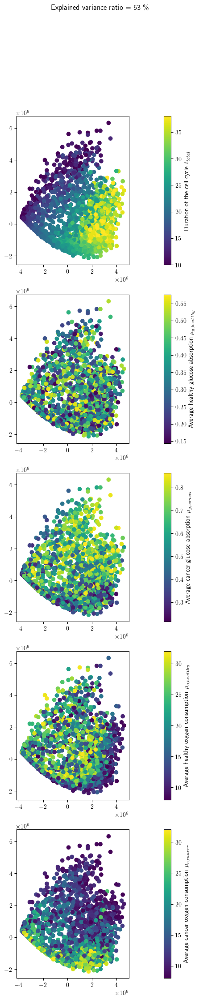

In [47]:
data = list()
draws = range(350,1150,100)

file_start = os.path.join(dataset_name,"pca",f'pca_combined_vr*')
matching_files = glob.glob(file_start)[0]
explained_variance = float(matching_files.split('=')[1][:-4])
pca_data = np.load(matching_files)

fig, ax = plt.subplots(1,5, figsize = (25,5))
for i, param in enumerate(parameters.keys()):
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    im = ax[i].scatter(pca_data[:,0],pca_data[:,1], c=target, rasterized = True)
    cbar = fig.colorbar(im, orientation='horizontal', pad=0.2, label=f"{parameters[param]}")
fig.suptitle(f"Explained variance ratio = {int(explained_variance*100)} \%")
plt.savefig(os.path.join(dataset_name,"pca", f'all_pca_combined.pdf'),bbox_inches='tight')

# Isomap
## All variation

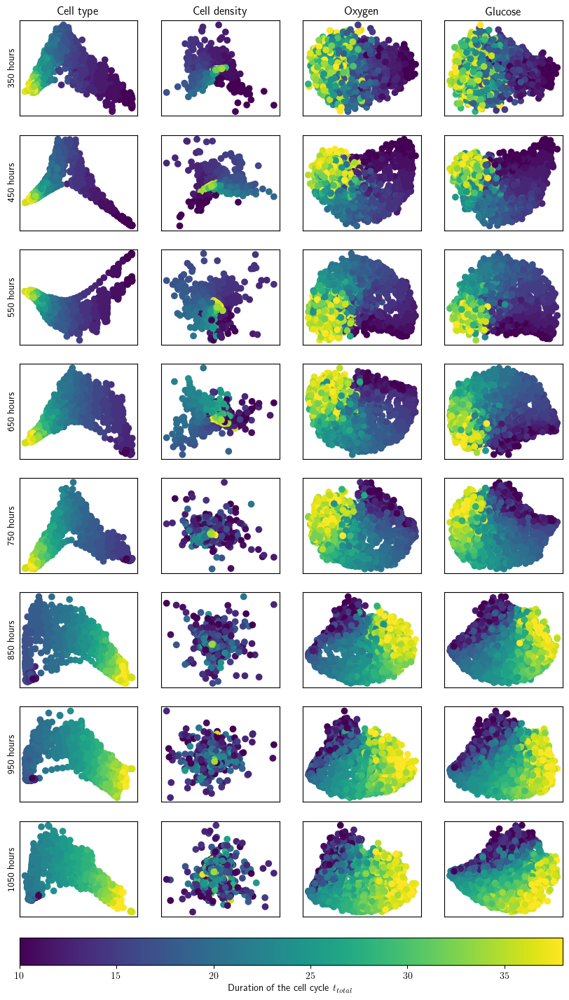

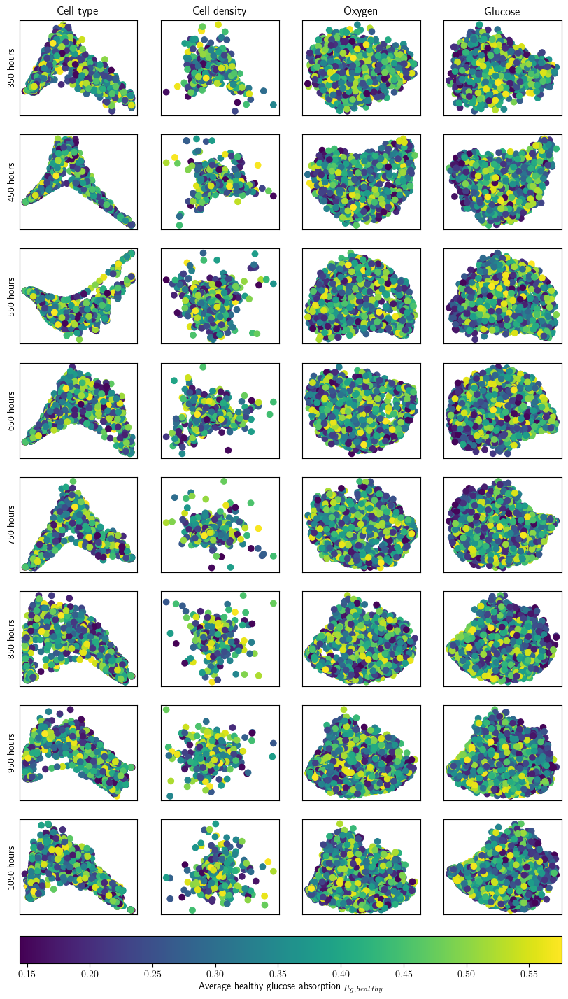

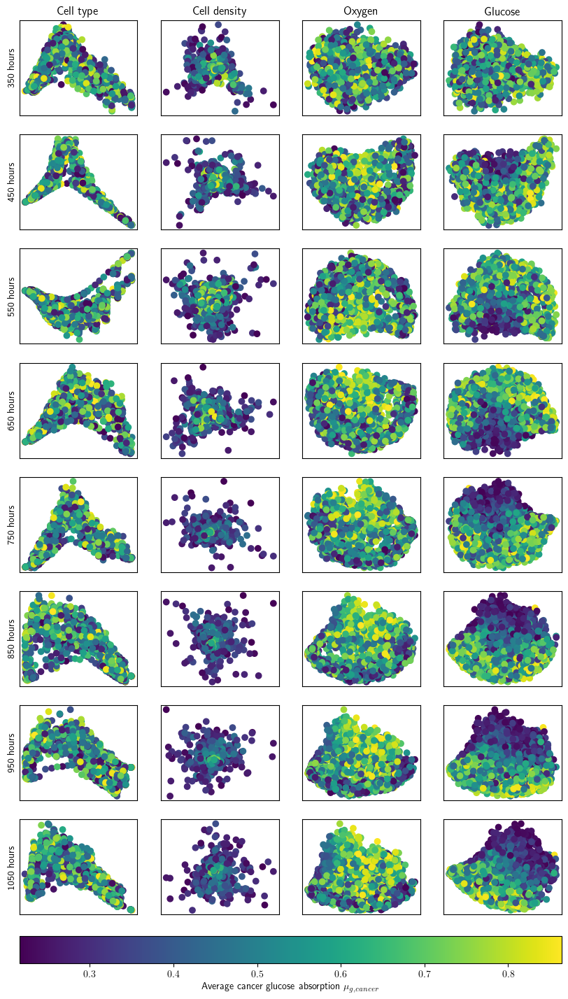

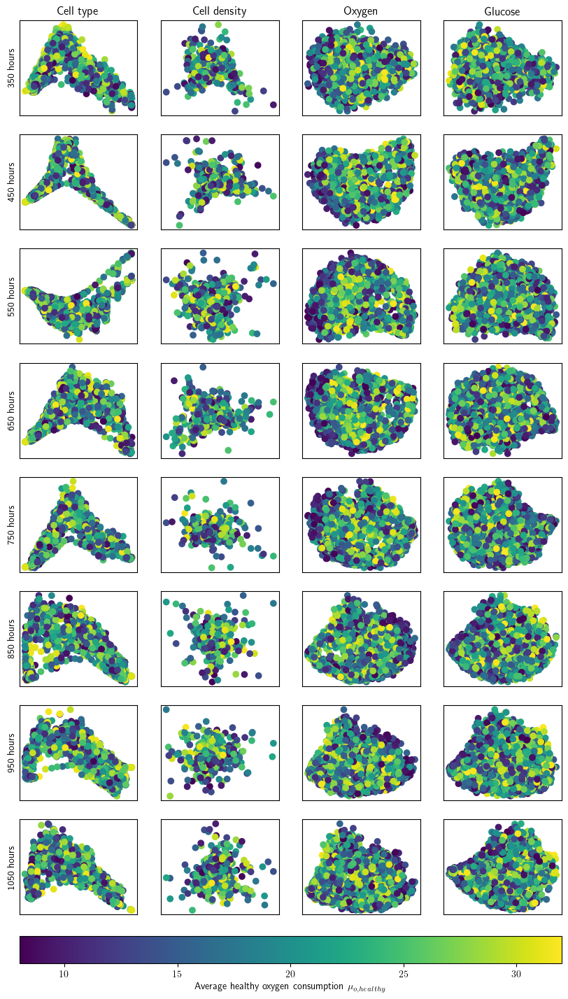

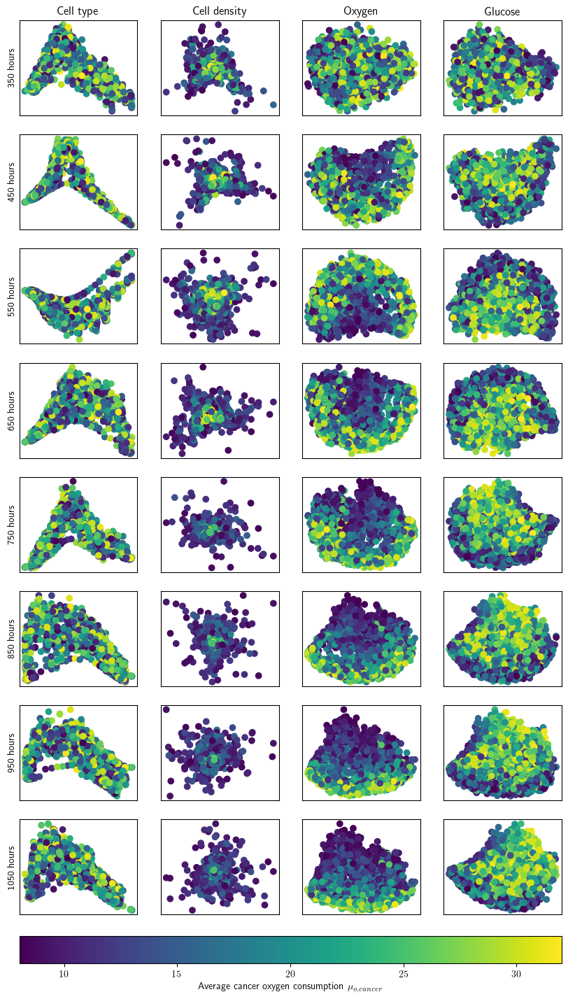

In [43]:
im=None
for param in parameters.keys():
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    for i, draw in enumerate(TIMESTEPS):
        for j, image_type in enumerate(IMG_TYPES):
            isomap_data = np.load(os.path.join(dataset_name,"isomap",f"isomap_{image_type}_{draw}.npy"))
            im = ax[i,j].scatter(isomap_data[:,0],isomap_data[:,1], c=target, rasterized = True)
            
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            
            
                
    for axes, col in zip(ax[0], ["Cell type","Cell density","Oxygen","Glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], range(350,1150,100)):
        axes.set_ylabel(f"{row} hours")
        
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.02, label=f"{parameters[param]}")
    plt.savefig(os.path.join(dataset_name,"isomap", f'all_isomap_{param}.pdf'),bbox_inches='tight')


## Combined isomap

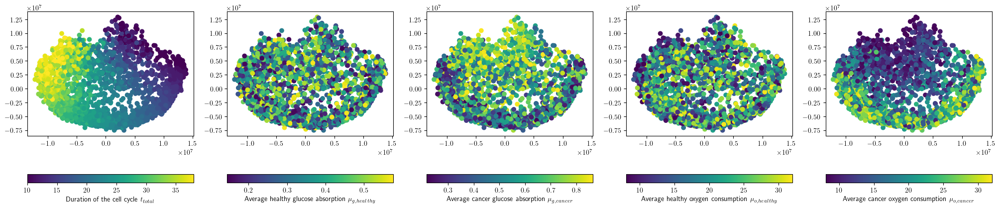

In [44]:
data = list()
draws = range(350,1150,100)

isomap_data = np.load(os.path.join(dataset_name,"isomap",f"isomap_combined.npy"))

fig, ax = plt.subplots(1,5, figsize = (25,5))
for i, param in enumerate(parameters.keys()):
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    im = ax[i].scatter(isomap_data[:,0],isomap_data[:,1], c=target, rasterized = True)
    cbar = fig.colorbar(im, orientation='horizontal', pad=0.2, label=f"{parameters[param]}")
plt.savefig(os.path.join(dataset_name,"isomap", f'all_isomap_combined.pdf'),bbox_inches='tight')

# Mutual information

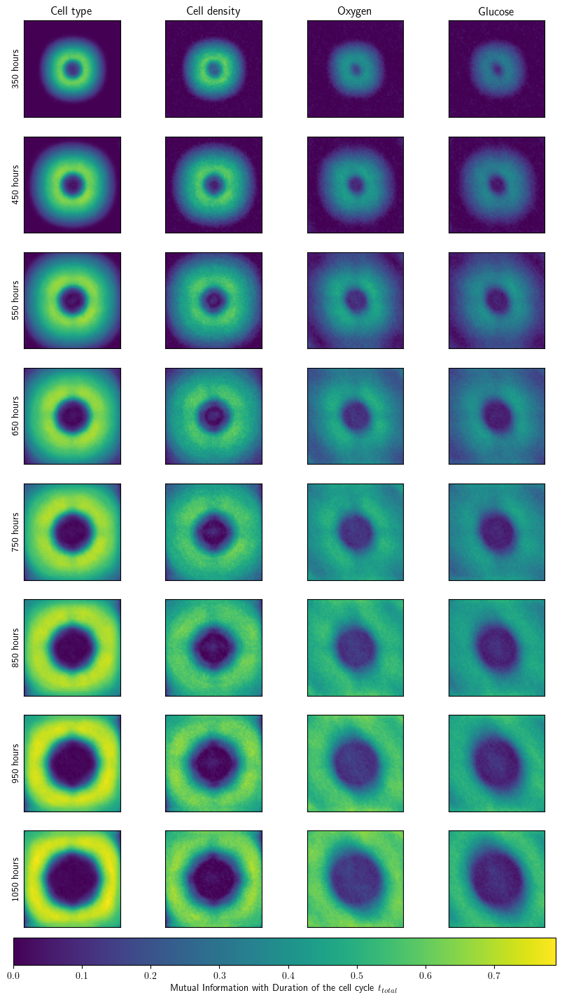

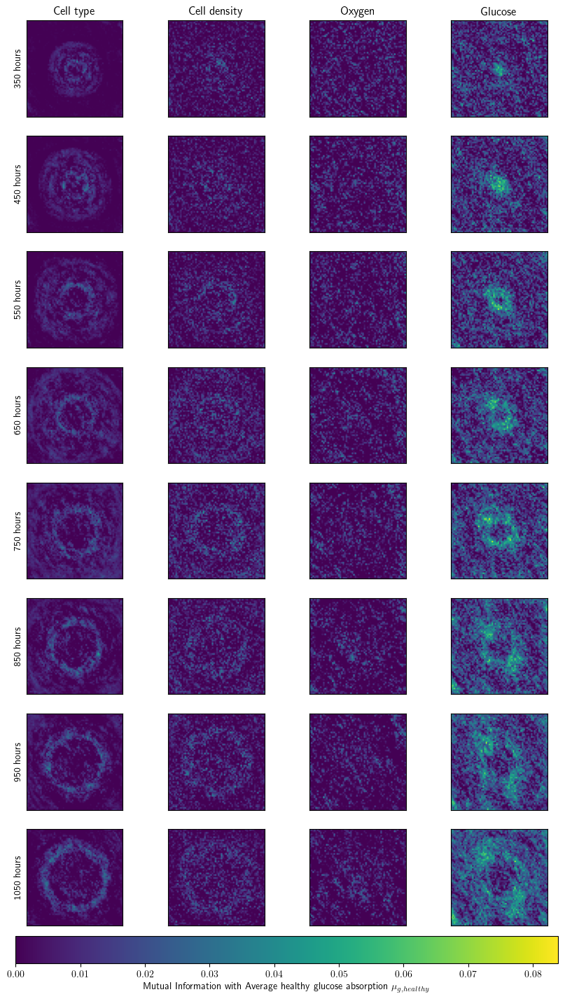

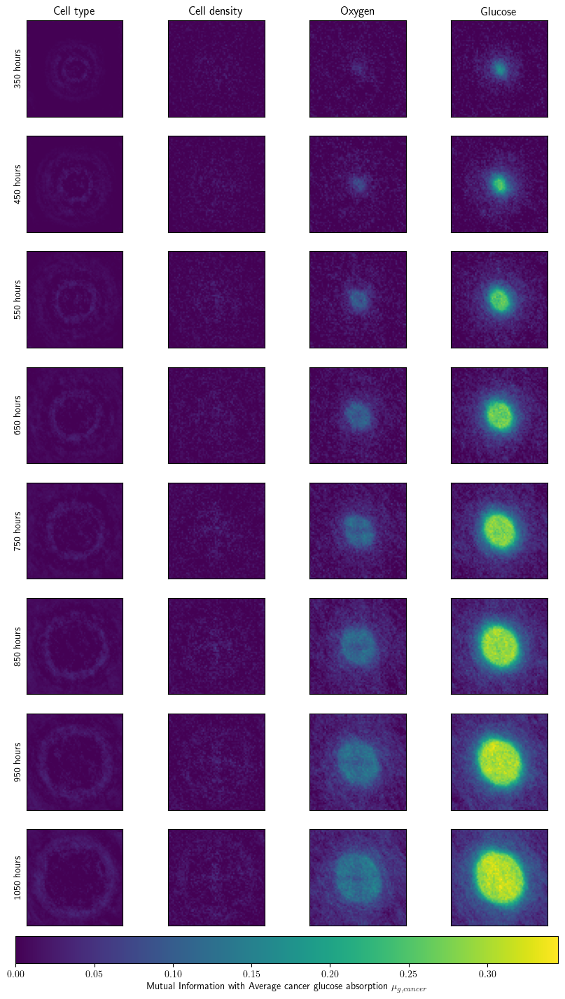

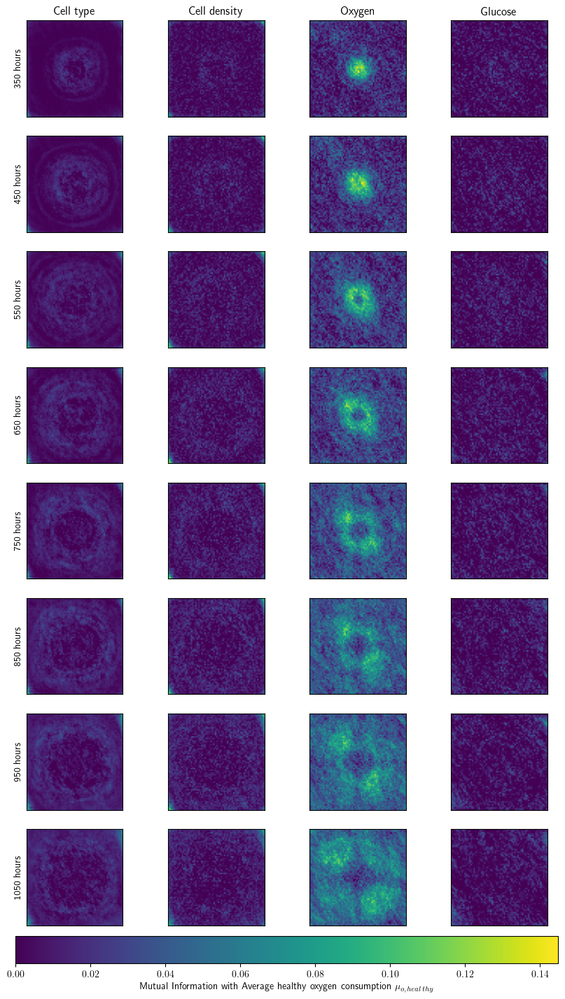

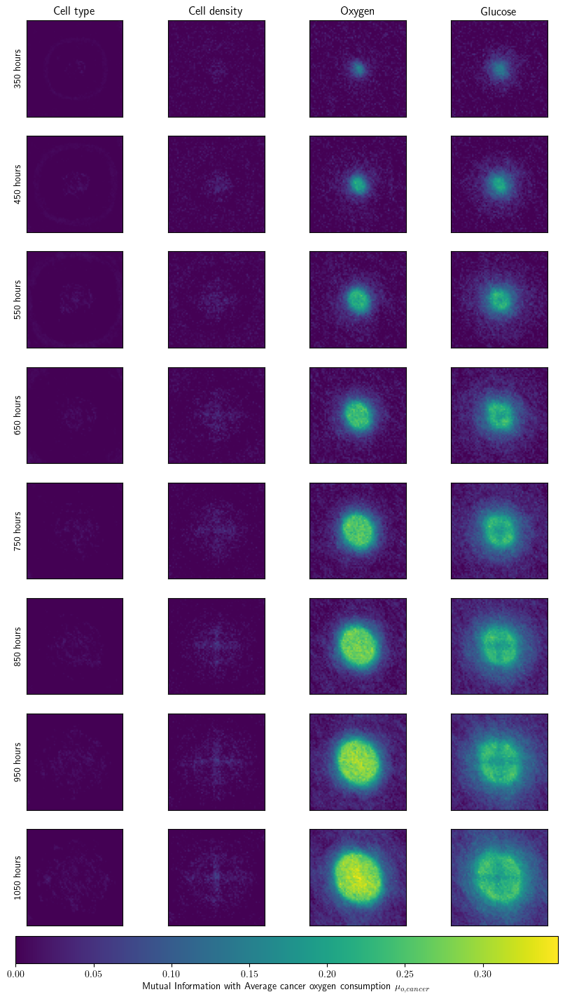

In [16]:
for param in parameters.keys():
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    im = None
    mutual_information = {}
    v_min = np.inf
    v_max = -np.inf
    for i, draw in enumerate(TIMESTEPS):
        mutual_information[draw] = dict()
        for j, image_type in enumerate(IMG_TYPES):
            mutual_information[draw][image_type] = np.load(os.path.join(dataset_name,"mi",f'mi_{draw}_{image_type}_{param}.npy'))
            v_min = min(v_min, mutual_information[draw][image_type].min())
            v_max = max(v_max, mutual_information[draw][image_type].max())
    for i, draw in enumerate(TIMESTEPS):
        for j, image_type in enumerate(IMG_TYPES):
            im = ax[i,j].imshow(mutual_information[draw][image_type], vmin=v_min, vmax=v_max, rasterized = True)
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
    for axes, col in zip(ax[0], ["Cell type","Cell density","Oxygen","Glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], TIMESTEPS):
        axes.set_ylabel(f"{row} hours")
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.01, label = f"Mutual Information with {parameters[param]}")
    plt.savefig(os.path.join(dataset_name,"mi", f'all_mutual_information_{param}.pdf'),bbox_inches='tight', dpi=100)


# Choose an image similarity metric

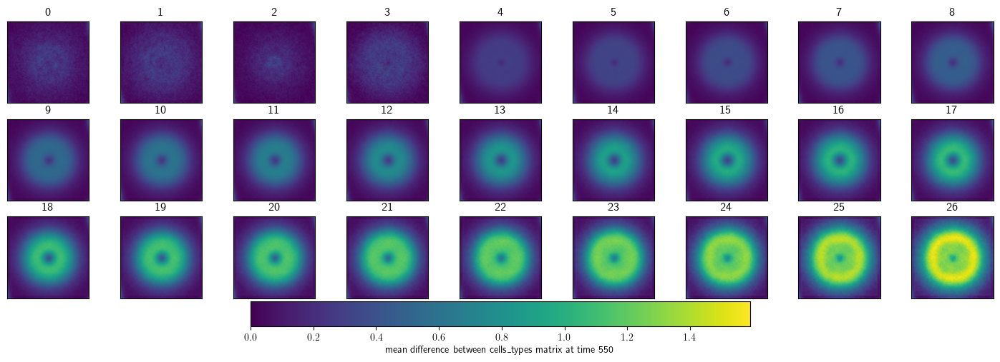

histogram correlation     : 	 Monotonically Decrease: 0.000 	 Low std: 0.302 	 Increase std: 0.279
ssim index                : 	 Monotonically Decrease: 0.000 	 Low std: 0.421 	 Increase std: -0.576
mean absolute error       : 	 Monotonically Decrease: 0.000 	 Low std: 0.312 	 Increase std: 0.064
root mean squared error   : 	 Monotonically Decrease: 0.000 	 Low std: 0.309 	 Increase std: -0.004
max absolute error        : 	 Monotonically Decrease: 0.000 	 Low std: 0.564 	 Increase std: -1.131
correlation               : 	 Monotonically Decrease: 0.004 	 Low std: 0.236 	 Increase std: -0.288
mutual information        : 	 Monotonically Decrease: 0.000 	 Low std: 0.321 	 Increase std: -0.734
cosine similarity         : 	 Monotonically Decrease: 0.000 	 Low std: 0.364 	 Increase std: 0.170
histogram intersection    : 	 Monotonically Decrease: 0.000 	 Low std: 0.246 	 Increase std: 0.075
dice-Sørensen coefficient : 	 Monotonically Decrease: 0.000 	 Low std: 0.184 	 Increase std: -0.114
jacc

In [ ]:
discrete = True

if discrete:
    param = list(parameters.keys())[0]
    image = "cells_types"
else:
    param = list(parameters.keys())[0]
    image = "oxygen"
    
timestep = 550
mean_or_std = "mean"
number_of_diff = 27
number_of_column = 9

# Show mean absolute difference
fig, ax = plt.subplots(3,number_of_column, figsize = (18,6))
files = [np.load(os.path.join(dataset_name,"similarity_between_matrix",f"{mean_or_std}_image absolute difference_{timestep}_{image}_{param}_{diff}.npy")) for diff in range(number_of_diff)]
v_min = np.min(files)
v_max = np.max(files)
im = None
for diff in range(number_of_diff):
    row = diff // number_of_column
    col = diff % number_of_column
    im = ax[row, col].imshow(files[diff], vmin=v_min, vmax=v_max)
    ax[row, col].set_title(f"{diff}")
    ax[row,col].xaxis.set_tick_params(labelbottom=False)
    ax[row,col].yaxis.set_tick_params(labelleft=False)
    ax[row,col].set_xticks([])
    ax[row,col].set_yticks([])

cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.01, shrink=0.5, label = f"{mean_or_std} difference between {image} matrix at time {timestep}")
plt.savefig(os.path.join(dataset_name,"similarity_between_matrix", f'{mean_or_std} difference between {image} matrix by difference in {param} at time {timestep}.pdf'),bbox_inches='tight', dpi=400)
plt.show()

# Show metrics
fig, ax = plt.subplots(1,2, figsize = (18,6))
df = pd.read_csv(os.path.join(dataset_name,"similarity_between_matrix","scalar_similarity.csv"), index_col=0)
X = np.arange(0,number_of_diff,1)
monotonically_decreasing_score = dict()
low_std_score = dict()
increase_std_score = dict()
for metric in SimilarityMetric:
    if metric != SimilarityMetric.IMAGE_ABSOLUTE_DIFFERENCE:
        if not (image != "cells_types" and (metric==SimilarityMetric.DICE or metric==SimilarityMetric.JACCARD)):
            Y_mean = np.array([df.loc[(df["Metric"]==metric.__str__()) & (df["Timestep"]==timestep) & (df["Img_Type"]==image) & (df["Parameter"]==param) & (df["Difference"]==diff), "Mean_Similarity_Measure"] for diff in range(number_of_diff)] )
            Y_std = np.array([df.loc[(df["Metric"]==metric.__str__()) & (df["Timestep"]==timestep) & (df["Img_Type"]==image) & (df["Parameter"]==param) & (df["Difference"]==diff), "Std_Similarity_Measure"] for diff in range(number_of_diff)] )
            Y_mean_scaled= ( Y_mean  -np.min(Y_mean))/( np.max(Y_mean)-np.min(Y_mean) )
            Y_std_scaled= Y_std/( np.max(Y_mean)-np.min(Y_mean) )
            

            # We want a mean that goes from 1 to 0 and not increase
            monotonically_decreasing_score[metric.__str__()] = sum([y[0] - x[0] for x, y in zip(Y_mean_scaled, Y_mean_scaled[1:]) if y-x > 0])

            # We want a standard deviation as low as possible
            low_std_score[metric.__str__()] = np.mean(Y_std_scaled)

            # We want a standard deviation that increase
            increase_std_score[metric.__str__()] = (Y_std_scaled[-1]-Y_std_scaled[0])[0]

            ax[0].plot(X, Y_mean_scaled, label=metric.__str__())
            ax[1].plot(X, Y_std_scaled, label=metric.__str__())
            
ax[0].set_xlabel(f"Difference in {parameters[param]}")
ax[0].set_ylabel(f"Mean of the metric")
ax[1].set_xlabel(f"Difference in {parameters[param]}")
ax[1].set_ylabel(f"Standard deviation of the metric")
ax[0].legend()

scores = pd.DataFrame(columns=["Metric", " Monotonically Decrease", " Low Standard Deviation", " Standard Deviation Increase"])
for metric in monotonically_decreasing_score.keys():
    print(f"{metric:<25} : \t Monotonically Decrease: {monotonically_decreasing_score[metric]:.3f} \t Low std: {low_std_score[metric]:.3f} \t Increase std: {increase_std_score[metric]:.3f}")
    scores.loc[-1] = [metric.__str__(), monotonically_decreasing_score[metric], low_std_score[metric],increase_std_score[metric]]
    scores.index = scores.index + 1
    scores = scores.sort_index()
scores = scores.round(3)
scores.to_csv(os.path.join(dataset_name,"similarity_between_matrix","metrics_scores.csv"))
plt.savefig(os.path.join(dataset_name,"similarity_between_matrix", f"metrics between image by difference in {param} at time {timestep} for {image} matrix.pdf"),dpi=400, bbox_inches='tight')